Data Visualization

In [2]:
!pip install pandas matplotlib seaborn
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sqlite3

In [3]:
df = pd.read_csv("cleaned_analyzed_survey.csv")
print(df.head())

   ResponseId                      MainBranch                 Age  \
0           1  I am a developer by profession  Under 18 years old   
1           2  I am a developer by profession     35-44 years old   
2           3  I am a developer by profession     45-54 years old   
3           4           I am learning to code     18-24 years old   
4           5  I am a developer by profession     18-24 years old   

            Employment                            RemoteWork   Check  \
0  Employed, full-time                                Remote  Apples   
1  Employed, full-time                                Remote  Apples   
2  Employed, full-time                                Remote  Apples   
3   Student, full-time  Hybrid (some remote, some in-person)  Apples   
4   Student, full-time  Hybrid (some remote, some in-person)  Apples   

                                    CodingActivities  \
0                                              Hobby   
1  Hobby;Contribute to open-source proje

In [4]:
df = df.loc[:, ~df.columns.duplicated()]
print(df.columns.value_counts())


ResponseId                                                                                                                                                                                                                         1
Employment_Employed, full-time;Student, full-time;Not employed, but looking for work                                                                                                                                               1
Employment_Employed, full-time;Student, full-time;Not employed, but looking for work;Independent contractor, freelancer, or self-employed;Employed, part-time                                                                      1
Employment_Employed, full-time;Student, full-time;Not employed, but looking for work;Independent contractor, freelancer, or self-employed;Not employed, and not looking for work;Student, part-time;Employed, part-time            1
Employment_Employed, full-time;Student, full-time;Not employed, but looking for work

In [5]:
# Remove duplicate columns by label first
df = df.loc[:, ~df.columns.duplicated()]

# Verify there are no duplicates
print(df.columns.value_counts())


ResponseId                                                                                                                                                                                                                         1
Employment_Employed, full-time;Student, full-time;Not employed, but looking for work                                                                                                                                               1
Employment_Employed, full-time;Student, full-time;Not employed, but looking for work;Independent contractor, freelancer, or self-employed;Employed, part-time                                                                      1
Employment_Employed, full-time;Student, full-time;Not employed, but looking for work;Independent contractor, freelancer, or self-employed;Not employed, and not looking for work;Student, part-time;Employed, part-time            1
Employment_Employed, full-time;Student, full-time;Not employed, but looking for work

In [6]:
import collections
print(collections.Counter(df.columns))


Counter({'ResponseId': 1, 'MainBranch': 1, 'Age': 1, 'Employment': 1, 'RemoteWork': 1, 'Check': 1, 'CodingActivities': 1, 'EdLevel': 1, 'LearnCode': 1, 'LearnCodeOnline': 1, 'TechDoc': 1, 'YearsCode': 1, 'YearsCodePro': 1, 'DevType': 1, 'OrgSize': 1, 'PurchaseInfluence': 1, 'BuyNewTool': 1, 'BuildvsBuy': 1, 'TechEndorse': 1, 'Country': 1, 'Currency': 1, 'CompTotal': 1, 'LanguageHaveWorkedWith': 1, 'LanguageWantToWorkWith': 1, 'LanguageAdmired': 1, 'DatabaseHaveWorkedWith': 1, 'DatabaseWantToWorkWith': 1, 'DatabaseAdmired': 1, 'PlatformHaveWorkedWith': 1, 'PlatformWantToWorkWith': 1, 'PlatformAdmired': 1, 'WebframeHaveWorkedWith': 1, 'WebframeWantToWorkWith': 1, 'WebframeAdmired': 1, 'EmbeddedHaveWorkedWith': 1, 'EmbeddedWantToWorkWith': 1, 'EmbeddedAdmired': 1, 'MiscTechHaveWorkedWith': 1, 'MiscTechWantToWorkWith': 1, 'MiscTechAdmired': 1, 'ToolsTechHaveWorkedWith': 1, 'ToolsTechWantToWorkWith': 1, 'ToolsTechAdmired': 1, 'NEWCollabToolsHaveWorkedWith': 1, 'NEWCollabToolsWantToWorkWith'

In [7]:
df.columns = df.columns.str.strip()
df.columns = df.columns.str.replace('\s+', '_', regex=True)  # Replace spaces with underscore for safety


<>:2: SyntaxWarning: invalid escape sequence '\s'
<>:2: SyntaxWarning: invalid escape sequence '\s'
/var/folders/r4/p9whfw6x43b8g5m7n4qp05_c0000gn/T/ipykernel_39774/3479514638.py:2: SyntaxWarning: invalid escape sequence '\s'
  df.columns = df.columns.str.replace('\s+', '_', regex=True)  # Replace spaces with underscore for safety


In [8]:
df = df.loc[:, ~df.T.duplicated()]


In [9]:
def deduplicate_columns(columns):
    seen = {}
    new_columns = []
    for col in columns:
        if col not in seen:
            seen[col] = 1
            new_columns.append(col)
        else:
            seen[col] += 1
            new_columns.append(f"{col}_{seen[col]}")
    return new_columns

df.columns = deduplicate_columns(df.columns)


In [10]:
assert df.columns.is_unique, "Column names are still not unique!"


In [11]:
df = df.drop('ConvertedCompYearly_MinMax', axis=1)

In [12]:
# Deleted the duplicated col
# them connect to SQLite and save the cleaned DataFrame
conn = sqlite3.connect('survey_data.db')
df.to_sql('survey', conn, if_exists='replace', index=False)
conn.close()


In [13]:
# Verify Data from SQLite
conn = sqlite3.connect('survey_data.db')
query = "select * from survey limit 5;"
df_sql = pd.read_sql_query(query,conn)
print(df_sql.head())

   ResponseId                      MainBranch                 Age  \
0           1  I am a developer by profession  Under 18 years old   
1           2  I am a developer by profession     35-44 years old   
2           3  I am a developer by profession     45-54 years old   
3           4           I am learning to code     18-24 years old   
4           5  I am a developer by profession     18-24 years old   

            Employment                            RemoteWork   Check  \
0  Employed, full-time                                Remote  Apples   
1  Employed, full-time                                Remote  Apples   
2  Employed, full-time                                Remote  Apples   
3   Student, full-time  Hybrid (some remote, some in-person)  Apples   
4   Student, full-time  Hybrid (some remote, some in-person)  Apples   

                                    CodingActivities  \
0                                              Hobby   
1  Hobby;Contribute to open-source proje

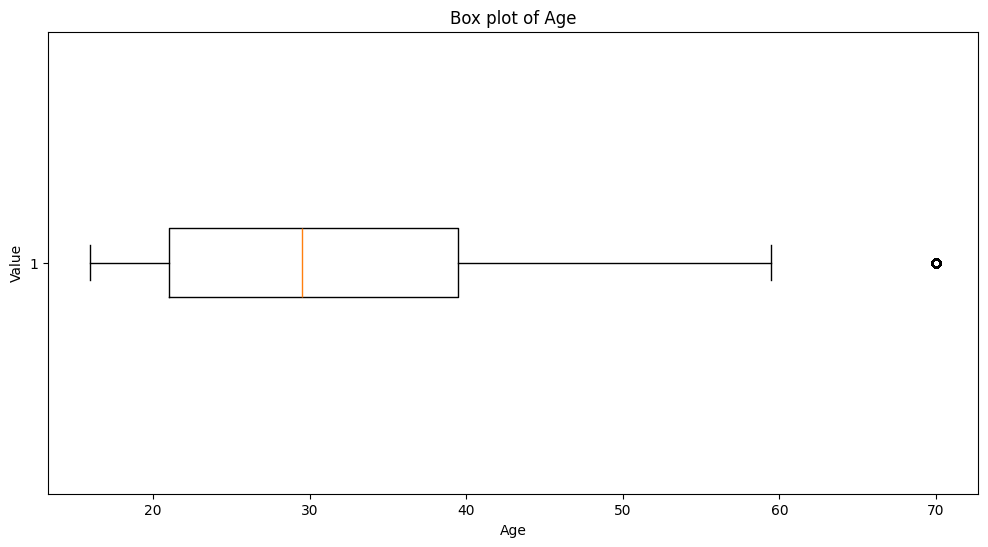

In [14]:
# Box Plot of Age
query = 'select * from survey where Age is not null;'
age_df = pd.read_sql_query(query,conn)

# Map age ranges to midpoints
age_map = {
	"Under 18 years old": 16,
	"18-24 years old": 21,
	"25-34 years old": 29.5,
	"35-44 years old": 39.5,
	"45-54 years old": 49.5,
	"55-64 years old": 59.5,
	"65 years or older": 70
}
age_numeric = age_df['Age'].map(age_map)

plt.figure(figsize=(12,6))
plt.boxplot(age_numeric.dropna(), vert=False)
plt.title('Box plot of Age')
plt.xlabel('Age')
plt.ylabel('Value')
plt.show()

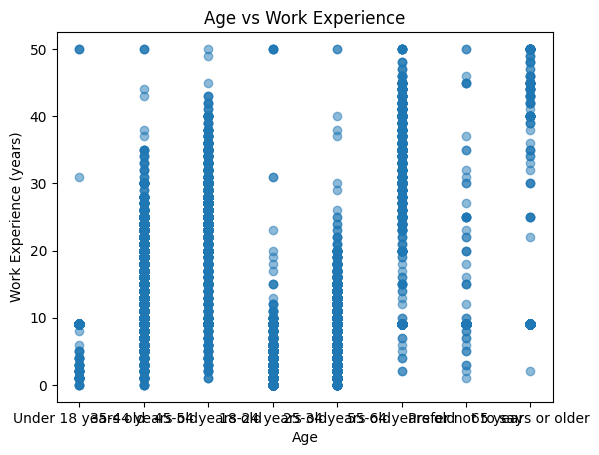

In [15]:
# Visualizing relationship in Data
# Scatter plot of Age vs Workexp
query = 'select * from survey where age is not null and WorkExp is not null;'
age_workexp_df = pd.read_sql_query(query,conn)
plt.scatter(age_workexp_df['Age'],age_workexp_df['WorkExp'],alpha=0.5)
plt.title('Age vs Work Experience')
plt.xlabel('Age')
plt.ylabel('Work Experience (years)')
plt.show()

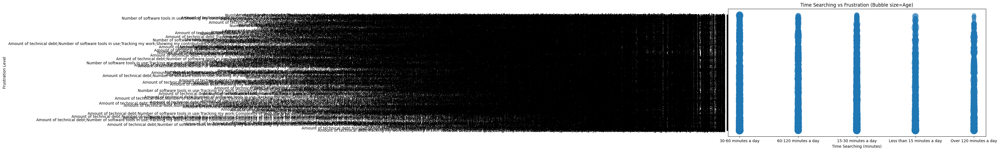

In [16]:
# Bubble plot of TimeSearching and Frustration (bubble size=Age)
query = 'select * from survey where TimeSearching is not null and Frustration is not null and Age is not null;'
time_frustration_df = pd.read_sql_query(query,conn)

# Map age ranges to midpoints for bubble size
age_map = {
	"Under 18 years old": 16,
	"18-24 years old": 21,
	"25-34 years old": 29.5,
	"35-44 years old": 39.5,
	"45-54 years old": 49.5,
	"55-64 years old": 59.5,
	"65 years or older": 70
}
bubble_size = time_frustration_df['Age'].map(age_map) * 5
plt.figure(figsize=(12,6))
plt.scatter(time_frustration_df['TimeSearching'], time_frustration_df['Frustration'], s=bubble_size, alpha=0.5)
plt.title('Time Searching vs Frustration (Bubble size=Age)')
plt.xlabel('Time Searching (minutes)')
plt.ylabel('Frustration Level')
plt.show()

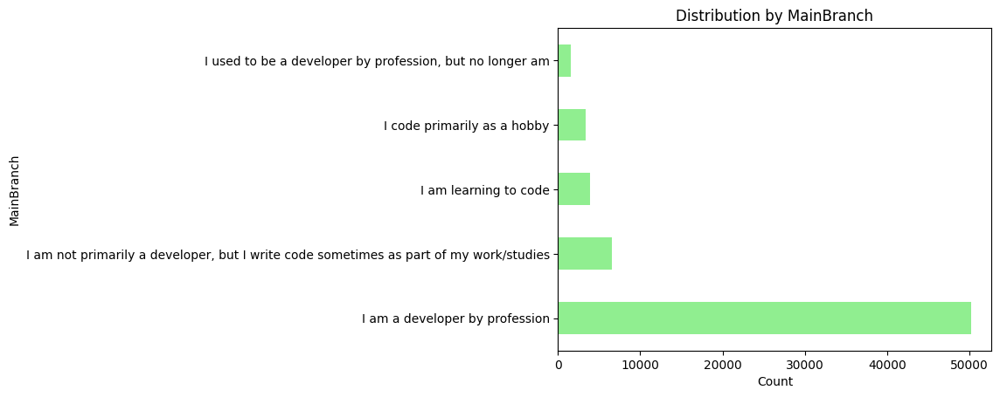

In [18]:
QUERY = """
SELECT MainBranch FROM survey WHERE MainBranch IS NOT NULL
"""
branch_df = pd.read_sql_query(QUERY, conn)
counts = branch_df['MainBranch'].value_counts()
counts.plot(kind='barh', color='lightgreen')
plt.title('Distribution by MainBranch')
plt.xlabel('Count')
plt.ylabel('MainBranch')
plt.show()


In [19]:
conn.close()

In [20]:
conn = sqlite3.connect('survey_data.db')

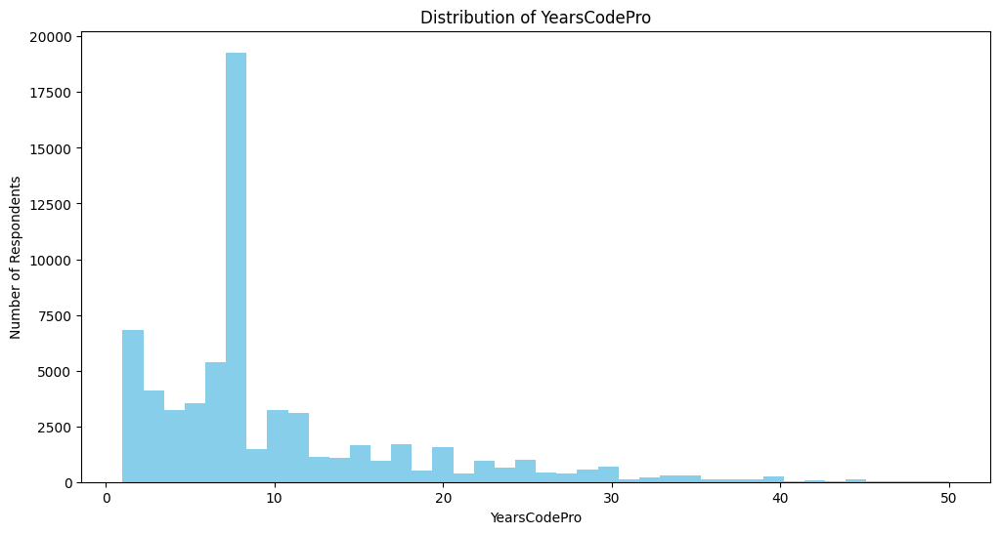

In [21]:
# Histogram of YearsCodePro
query = """
select YearsCodePro
from survey
where YearsCodePro is not null""" 
yearscodepro_df=pd.read_sql_query(query,conn)
plt.figure(figsize=(12,6))
plt.hist(yearscodepro_df['YearsCodePro'],bins=40,color='skyblue')
plt.title('Distribution of YearsCodePro')
plt.xlabel('YearsCodePro')
plt.ylabel('Number of Respondents')
plt.show()

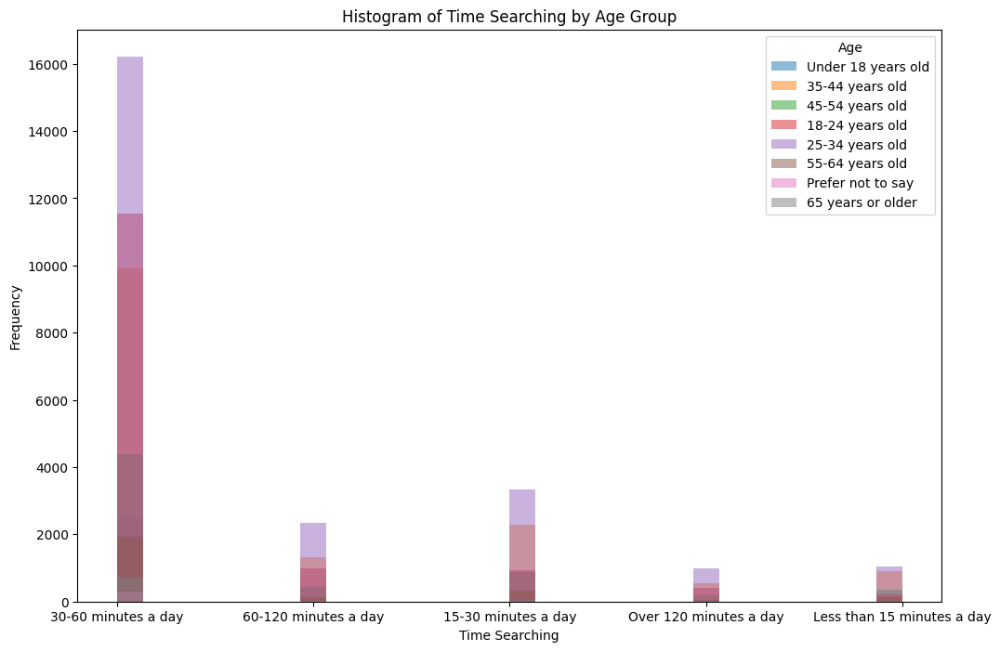

In [22]:
QUERY = """
SELECT Age, TimeSearching FROM survey
WHERE Age IS NOT NULL AND TimeSearching IS NOT NULL
"""
ts_df = pd.read_sql_query(QUERY, conn)

plt.figure(figsize=(12,8))
age_groups = ts_df['Age'].unique()
for age_group in age_groups:
    subset = ts_df[ts_df['Age'] == age_group]
    plt.hist(subset['TimeSearching'], bins=30, alpha=0.5, label=age_group)

plt.title('Histogram of Time Searching by Age Group')
plt.xlabel('Time Searching')
plt.ylabel('Frequency')
plt.legend(title='Age')
plt.show()


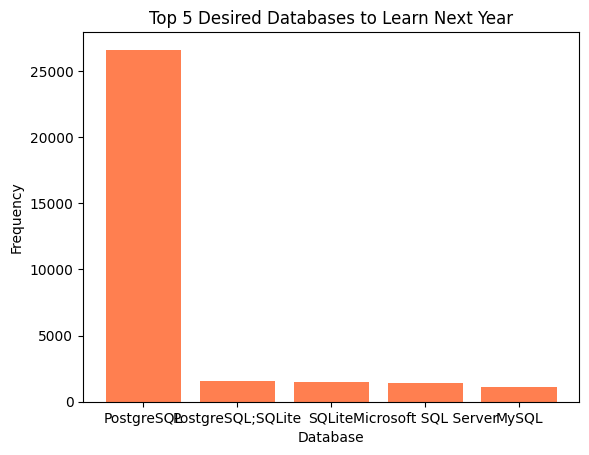

In [23]:
QUERY = """
SELECT DatabaseWantToWorkWith FROM survey WHERE DatabaseWantToWorkWith IS NOT NULL
"""
db_df = pd.read_sql_query(QUERY, conn)

databases = ','.join(db_df['DatabaseWantToWorkWith']).split(',')
databases = [db.strip() for db in databases]

db_counts = pd.Series(databases).value_counts().head(5)
plt.bar(db_counts.index, db_counts.values, color='coral')
plt.title('Top 5 Desired Databases to Learn Next Year')
plt.xlabel('Database')
plt.ylabel('Frequency')
plt.show()


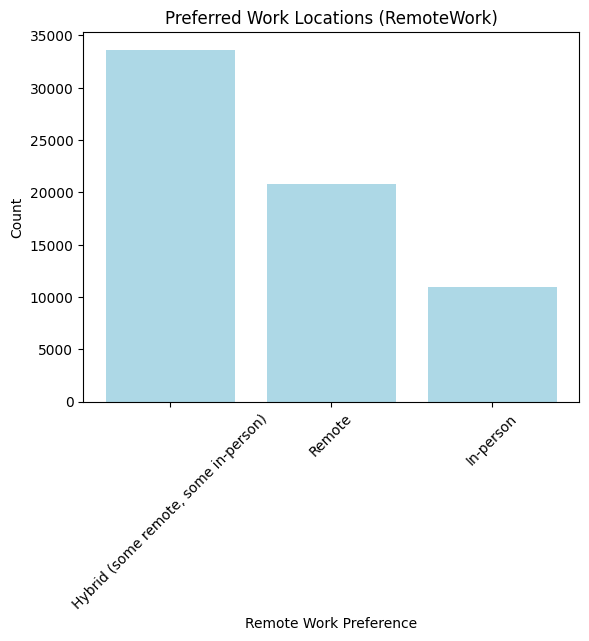

In [24]:
QUERY = """
SELECT RemoteWork FROM survey WHERE RemoteWork IS NOT NULL
"""
remote_df = pd.read_sql_query(QUERY, conn)

remote_counts = remote_df['RemoteWork'].value_counts()
plt.bar(remote_counts.index, remote_counts.values, color='lightblue')
plt.title('Preferred Work Locations (RemoteWork)')
plt.xlabel('Remote Work Preference')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


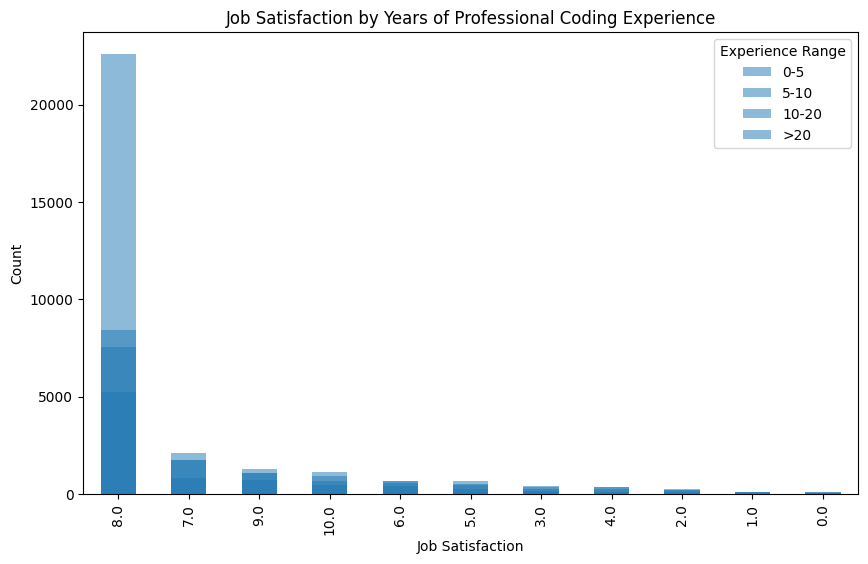

In [25]:
QUERY = """
SELECT JobSat, YearsCodePro FROM survey
WHERE JobSat IS NOT NULL AND YearsCodePro IS NOT NULL
"""
jobsat_df = pd.read_sql_query(QUERY, conn)

bins = ['0-5', '5-10', '10-20', '>20']
jobsat_df['YearsCodePro'] = pd.to_numeric(jobsat_df['YearsCodePro'], errors='coerce')

# Bin YearsCodePro
jobsat_df['ExperienceRange'] = pd.cut(
    jobsat_df['YearsCodePro'],
    bins=[0,5,10,20,100],
    labels=bins,
    right=False
)

plt.figure(figsize=(12,8))
for label in bins:
    subset = jobsat_df[jobsat_df['ExperienceRange'] == label]
    subset['JobSat'].value_counts().plot(
        kind='bar', alpha=0.5, label=label, figsize=(10, 6)
    )

plt.title('Job Satisfaction by Years of Professional Coding Experience')
plt.xlabel('Job Satisfaction')
plt.ylabel('Count')
plt.legend(title='Experience Range')
plt.show()


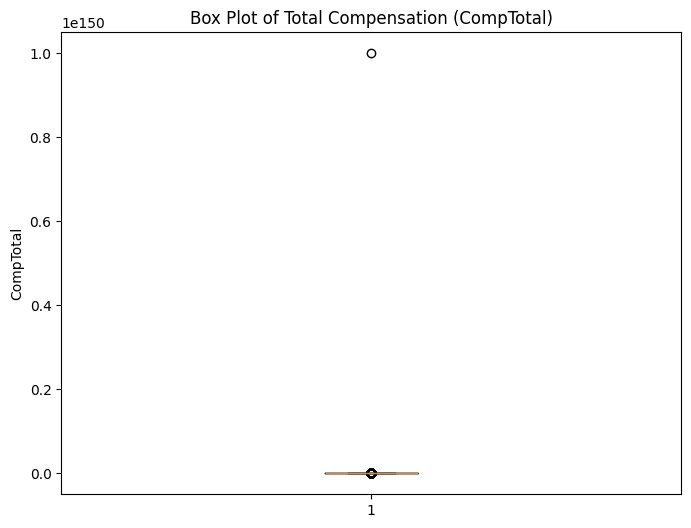

In [26]:
QUERY = "SELECT CompTotal FROM survey WHERE CompTotal IS NOT NULL"
df_comp = pd.read_sql_query(QUERY, conn)

plt.figure(figsize=(8,6))
plt.boxplot(df_comp['CompTotal'])
plt.title('Box Plot of Total Compensation (CompTotal)')
plt.ylabel('CompTotal')
plt.show()


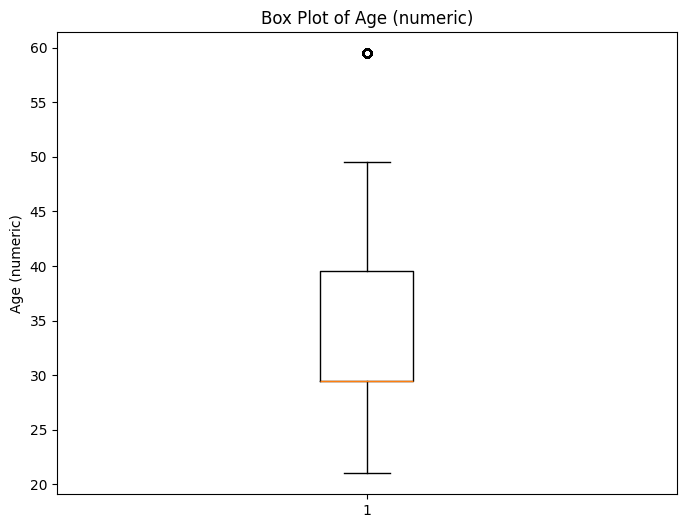

In [27]:
QUERY = "SELECT Age FROM survey WHERE Age IS NOT NULL"
df_age = pd.read_sql_query(QUERY, conn)

def age_to_num(age):
    if '-' in str(age):
        vals = str(age).split('-')
        return (int(vals[0]) + int(vals[1].split()[0])) / 2
    elif '>' in str(age):
        return int(age[1:3]) + 5
    else:
        try:
            return float(age)
        except:
            return None

df_age['AgeNumeric'] = df_age['Age'].apply(age_to_num)
plt.figure(figsize=(8,6))
plt.boxplot(df_age['AgeNumeric'].dropna())
plt.title('Box Plot of Age (numeric)')
plt.ylabel('Age (numeric)')
plt.show()


<Figure size 1000x700 with 0 Axes>

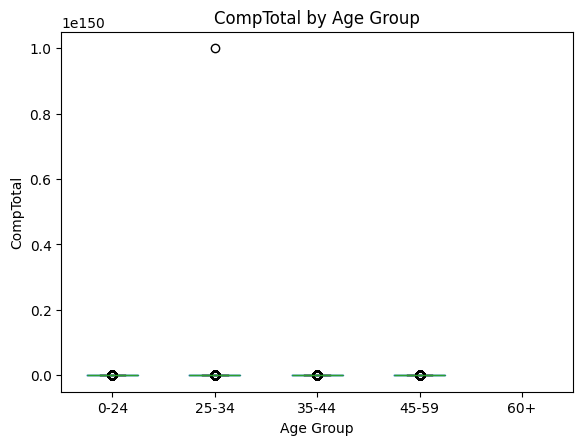

In [28]:
QUERY = "SELECT Age, CompTotal FROM survey WHERE Age IS NOT NULL AND CompTotal IS NOT NULL"
df_age_comp = pd.read_sql_query(QUERY, conn)
df_age_comp['AgeNumeric'] = df_age_comp['Age'].apply(age_to_num)

age_bins = [0, 25, 35, 45, 60, 100]
age_labels = ['0-24', '25-34', '35-44', '45-59', '60+']
df_age_comp['AgeGroup'] = pd.cut(df_age_comp['AgeNumeric'], bins=age_bins, labels=age_labels, right=False)

plt.figure(figsize=(10,7))
df_age_comp.boxplot(column='CompTotal', by='AgeGroup', grid=False)
plt.title('CompTotal by Age Group')
plt.suptitle('')
plt.xlabel('Age Group')
plt.ylabel('CompTotal')
plt.show()


<Figure size 1000x700 with 0 Axes>

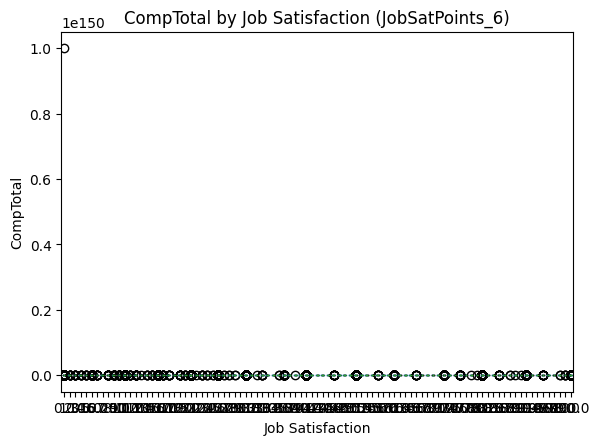

In [29]:
QUERY = "SELECT CompTotal, JobSatPoints_6 FROM survey WHERE CompTotal IS NOT NULL AND JobSatPoints_6 IS NOT NULL"
df_comp_sat = pd.read_sql_query(QUERY, conn)

plt.figure(figsize=(10,7))
df_comp_sat.boxplot(column='CompTotal', by='JobSatPoints_6', grid=False)
plt.title('CompTotal by Job Satisfaction (JobSatPoints_6)')
plt.suptitle('')
plt.xlabel('Job Satisfaction')
plt.ylabel('CompTotal')
plt.show()


<Figure size 1200x800 with 0 Axes>

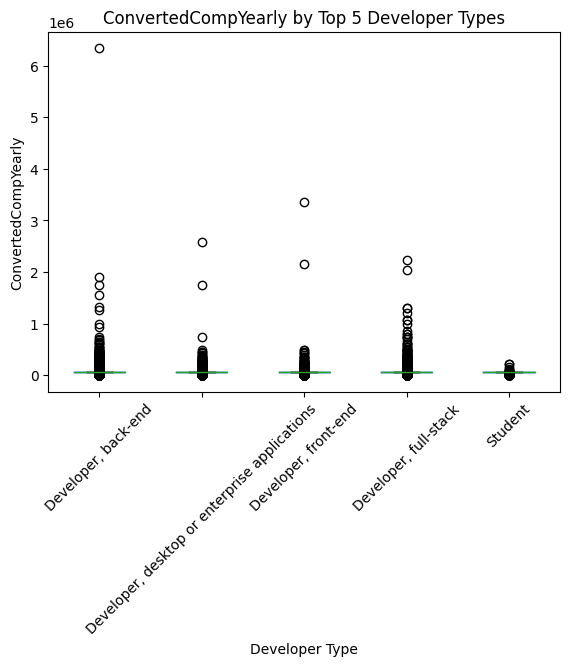

In [30]:
QUERY = "SELECT ConvertedCompYearly, DevType FROM survey WHERE ConvertedCompYearly IS NOT NULL AND DevType IS NOT NULL"
df_yearly_dev = pd.read_sql_query(QUERY, conn)

top_5_devtypes = df_yearly_dev['DevType'].value_counts().index[:5]
df_top_dev = df_yearly_dev[df_yearly_dev['DevType'].isin(top_5_devtypes)]

plt.figure(figsize=(12,8))
df_top_dev.boxplot(column='ConvertedCompYearly', by='DevType', grid=False)
plt.title('ConvertedCompYearly by Top 5 Developer Types')
plt.suptitle('')
plt.ylabel('ConvertedCompYearly')
plt.xlabel('Developer Type')
plt.xticks(rotation=45)
plt.show()


<Figure size 1000x700 with 0 Axes>

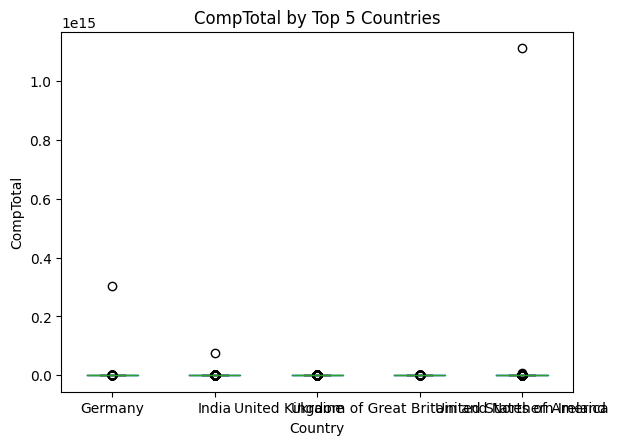

In [31]:
QUERY = "SELECT CompTotal, Country FROM survey WHERE CompTotal IS NOT NULL AND Country IS NOT NULL"
df_comp_country = pd.read_sql_query(QUERY, conn)

top_5_countries = df_comp_country['Country'].value_counts().index[:5]
df_top_countries = df_comp_country[df_comp_country['Country'].isin(top_5_countries)]

plt.figure(figsize=(10,7))
df_top_countries.boxplot(column='CompTotal', by='Country', grid=False)
plt.title('CompTotal by Top 5 Countries')
plt.suptitle('')
plt.ylabel('CompTotal')
plt.xlabel('Country')
plt.show()


<Figure size 1200x800 with 0 Axes>

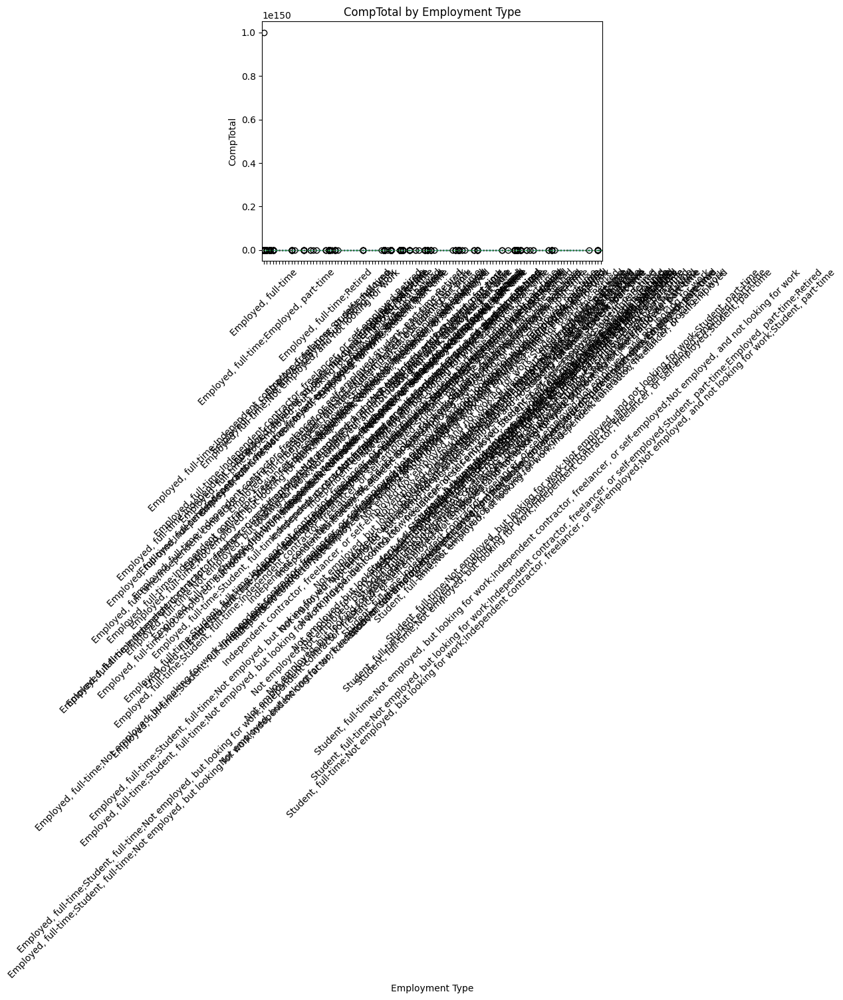

In [32]:
QUERY = "SELECT CompTotal, Employment FROM survey WHERE CompTotal IS NOT NULL AND Employment IS NOT NULL"
df_comp_emp = pd.read_sql_query(QUERY, conn)

plt.figure(figsize=(12,8))
df_comp_emp.boxplot(column='CompTotal', by='Employment', grid=False)
plt.title('CompTotal by Employment Type')
plt.suptitle('')
plt.xlabel('Employment Type')
plt.ylabel('CompTotal')
plt.xticks(rotation=45)
plt.show()


<Figure size 1000x700 with 0 Axes>

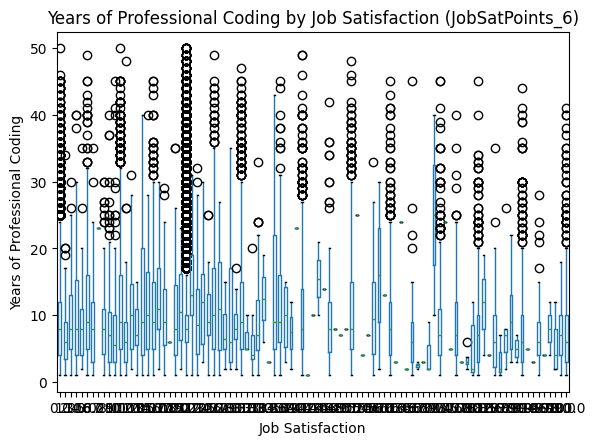

In [33]:
QUERY = "SELECT YearsCodePro, JobSatPoints_6 FROM survey WHERE YearsCodePro IS NOT NULL AND JobSatPoints_6 IS NOT NULL"
df_years_sat = pd.read_sql_query(QUERY, conn)

plt.figure(figsize=(10,7))
df_years_sat.boxplot(column='YearsCodePro', by='JobSatPoints_6', grid=False)
plt.title('Years of Professional Coding by Job Satisfaction (JobSatPoints_6)')
plt.suptitle('')
plt.xlabel('Job Satisfaction')
plt.ylabel('Years of Professional Coding')
plt.show()


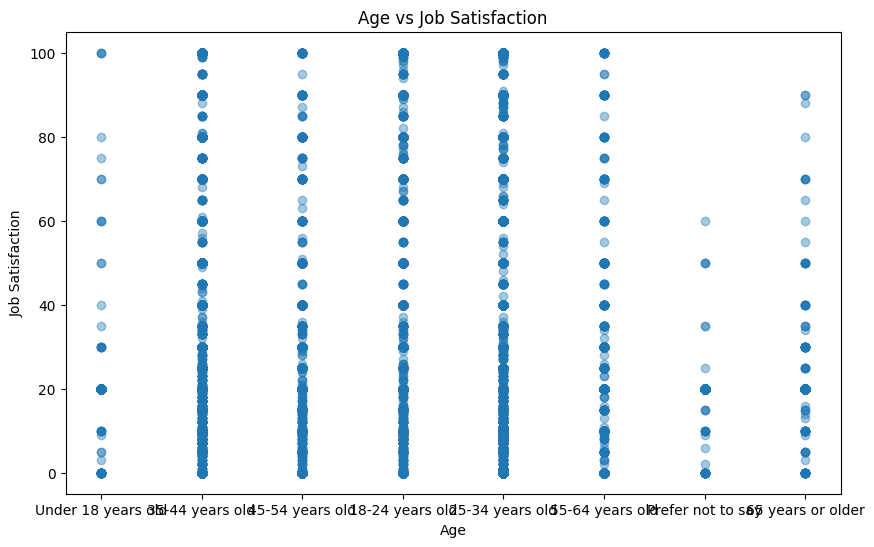

In [34]:
# Exploring Relatinships with Scatter Plots
# Age vs Job Satisfaction
plt.figure(figsize=(10,6))
plt.scatter(df['Age'],df['JobSatPoints_6'],alpha=0.4)
plt.title('Age vs Job Satisfaction')
plt.xlabel("Age")
plt.ylabel('Job Satisfaction')
plt.show()

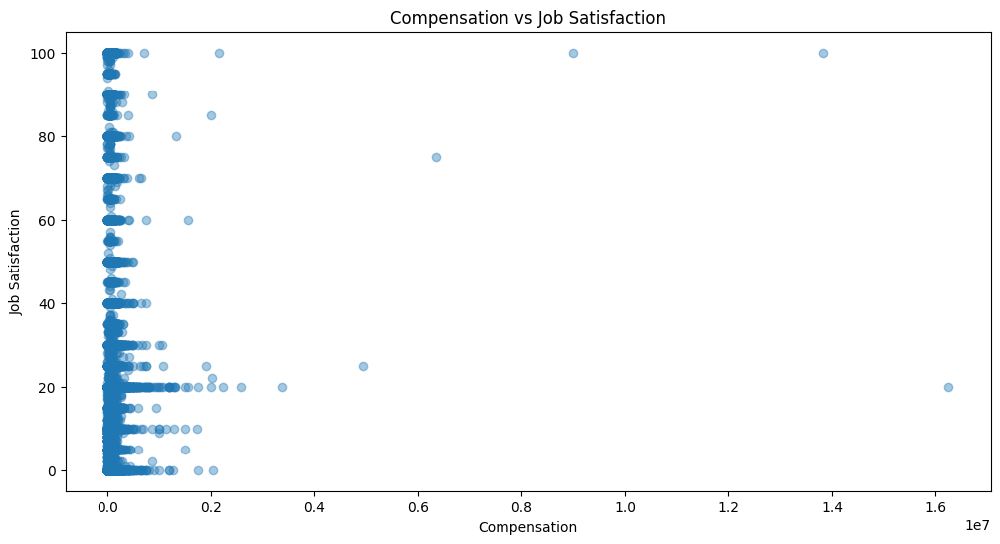

In [35]:
# Compensation vs Job Satisfaction
plt.figure(figsize=(12,6))
plt.scatter(df['ConvertedCompYearly'],df['JobSatPoints_6'],alpha=0.4)
plt.title('Compensation vs Job Satisfaction')
plt.xlabel('Compensation')
plt.ylabel('Job Satisfaction')
plt.show()

In [36]:
print(df[['Age','JobSatPoints_6']].dtypes)

Age                object
JobSatPoints_6    float64
dtype: object


In [37]:
df['Age']=pd.to_numeric(df['Age'],errors='coerce')
df['JobSatPoints_6']=pd.to_numeric(df['JobSatPoints_6'],errors='coerce')
print(df[['Age','JobSatPoints_6']].dtypes)

Age               float64
JobSatPoints_6    float64
dtype: object


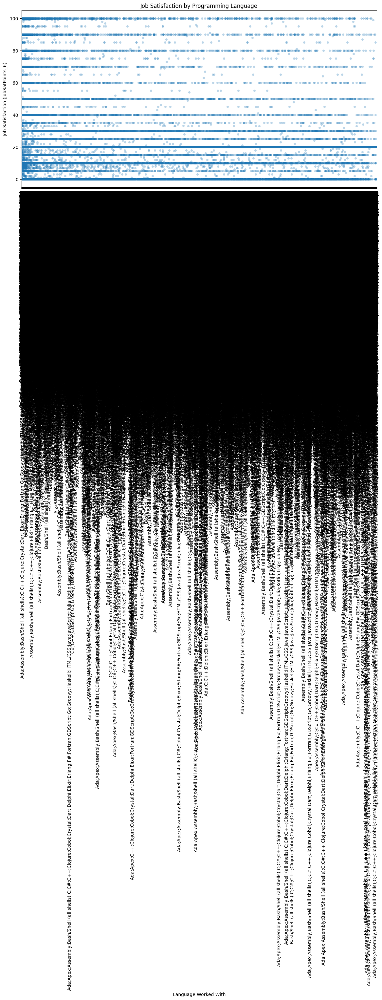

In [38]:
# Explode language lists into long-format DataFrame
lang_sat_df = df[['LanguageHaveWorkedWith', 'JobSatPoints_6']].dropna()
langs = lang_sat_df['LanguageHaveWorkedWith'].str.split(',').explode().str.strip()
lang_sat_df = lang_sat_df.assign(Language=langs).drop('LanguageHaveWorkedWith', axis=1)

plt.figure(figsize=(14,7))
sns.stripplot(x='Language', y='JobSatPoints_6', data=lang_sat_df, jitter=True, alpha=0.3)
plt.xticks(rotation=90)
plt.title('Job Satisfaction by Programming Language')
plt.ylabel('Job Satisfaction (JobSatPoints_6)')
plt.xlabel('Language Worked With')
plt.show()


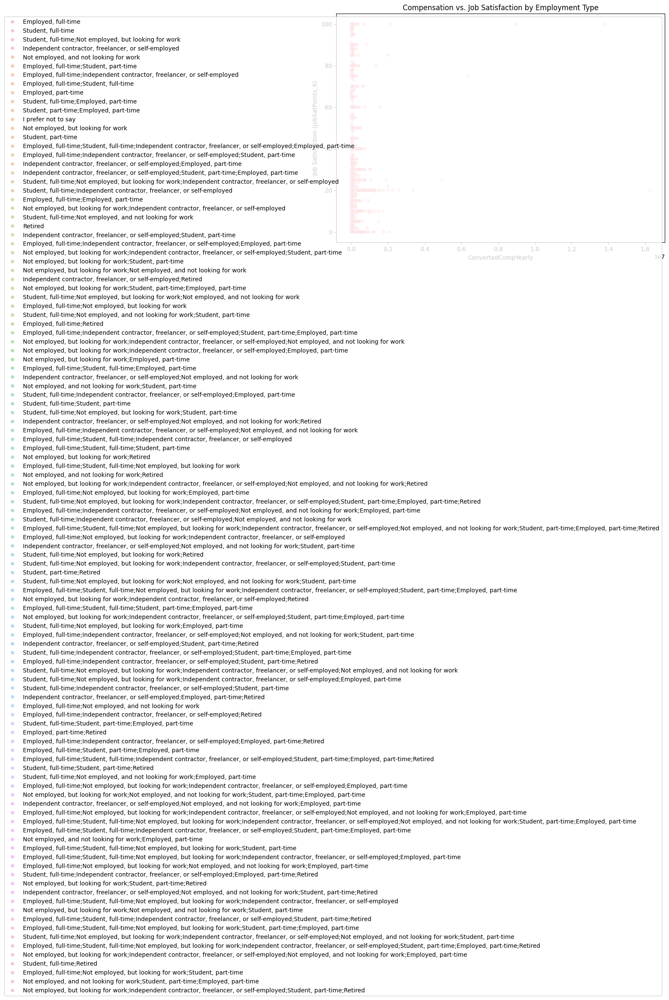

In [39]:
# Scatter plot comparision across group 
# compensation vs job satisfaction by employment type
plt.figure(figsize=(10, 7))
sns.scatterplot(
    x='ConvertedCompYearly',
    y='JobSatPoints_6',
    hue='Employment',
    data=df,
    alpha=0.4
)
plt.title('Compensation vs. Job Satisfaction by Employment Type')
plt.xlabel('ConvertedCompYearly')
plt.ylabel('Job Satisfaction (JobSatPoints_6)')
plt.legend(loc='best')
plt.show()


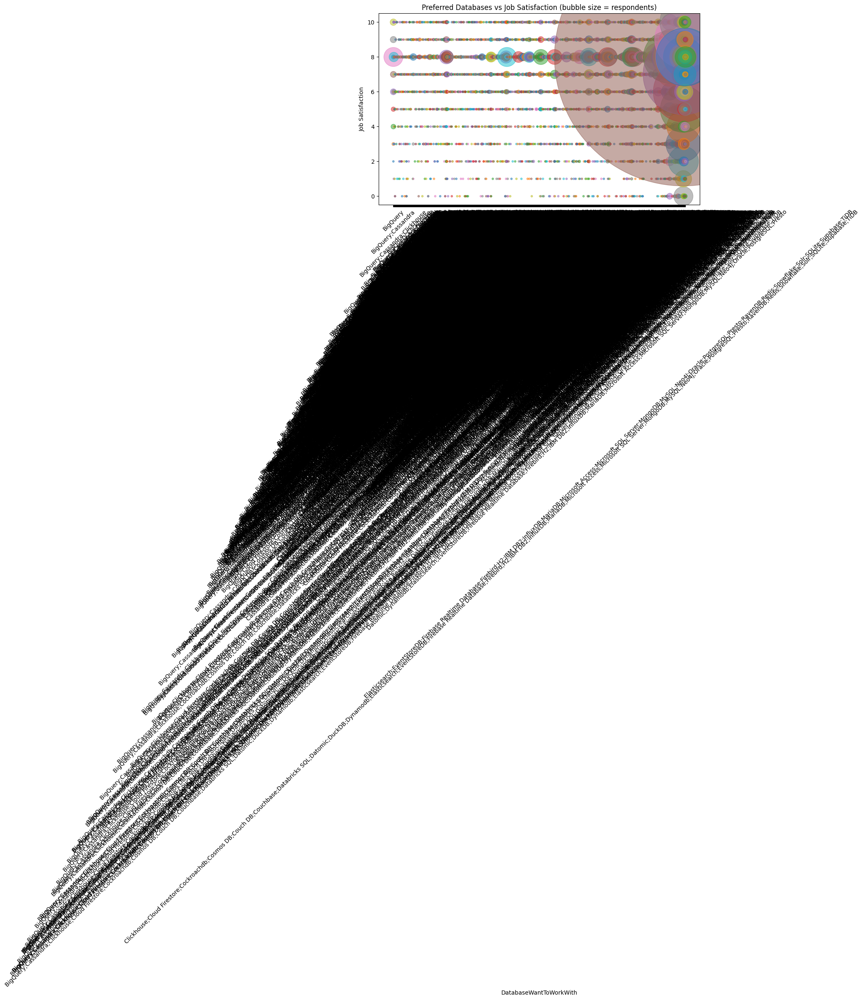

In [40]:
db_df = df[['DatabaseWantToWorkWith','JobSat']].dropna()
db_df = db_df.assign(
    Database=db_df['DatabaseWantToWorkWith'].str.split(',').explode().str.strip()
)
count_df = db_df.groupby(['Database','JobSat']).size().reset_index(name='Count')
plt.figure(figsize=(10,6))
for _, row in count_df.iterrows():
    plt.scatter(
        row['Database'],
        row['JobSat'],
        s=row['Count']*10,
        alpha=0.5
    )
plt.title('Preferred Databases vs Job Satisfaction (bubble size = respondents)')
plt.xlabel('DatabaseWantToWorkWith')
plt.ylabel('Job Satisfaction')
plt.xticks(rotation=45)
plt.show()


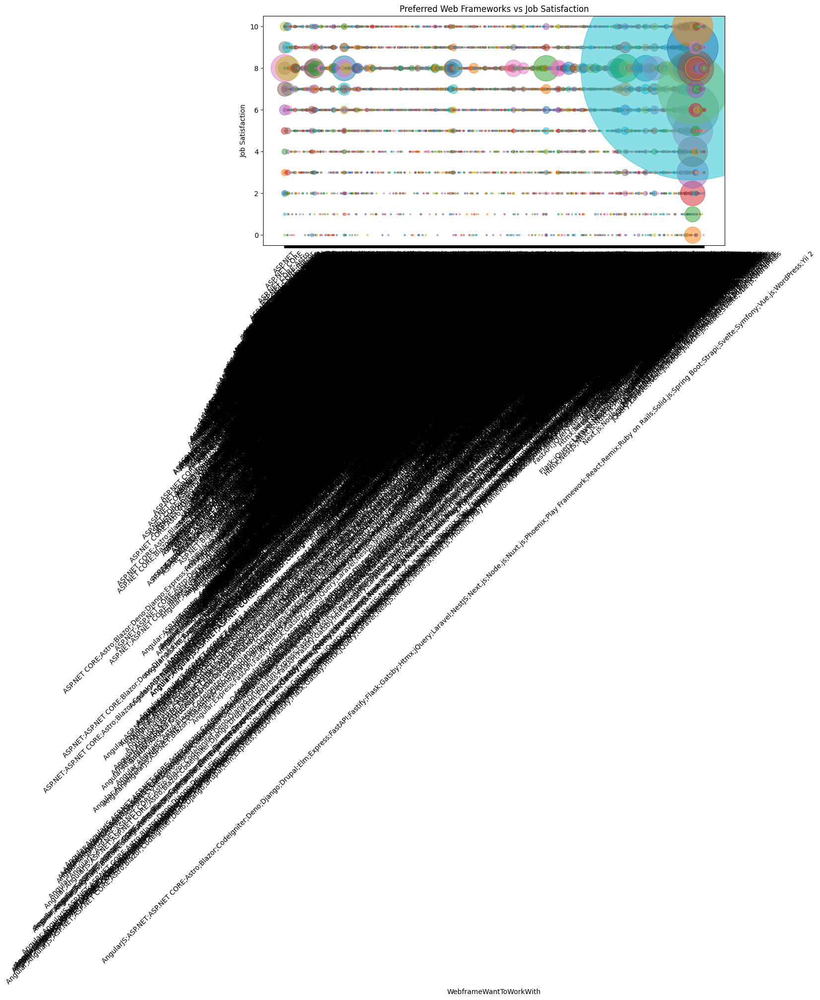

In [41]:
web_df = df[['WebframeWantToWorkWith','JobSat']].dropna()
web_df = web_df.assign(
    Framework=web_df['WebframeWantToWorkWith'].str.split(',').explode().str.strip()
)
count_df = web_df.groupby(['Framework','JobSat']).size().reset_index(name='Count')
plt.figure(figsize=(12,6))
for _, row in count_df.iterrows():
    plt.scatter(
        row['Framework'],
        row['JobSat'],
        s=row['Count']*5,
        alpha=0.5
    )
plt.title('Preferred Web Frameworks vs Job Satisfaction')
plt.xlabel('WebframeWantToWorkWith')
plt.ylabel('Job Satisfaction')
plt.xticks(rotation=45)
plt.show()


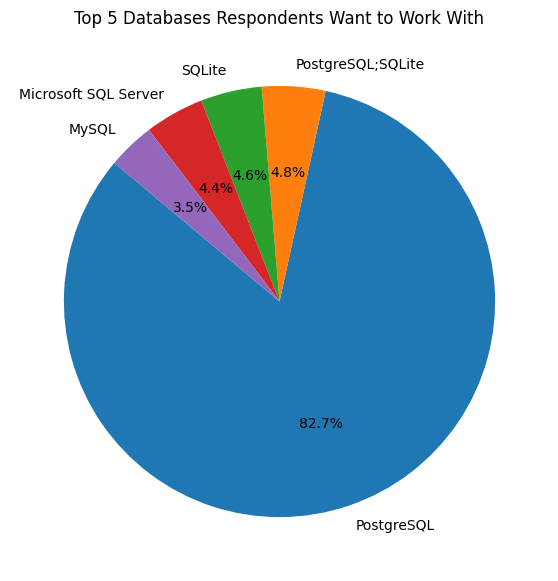

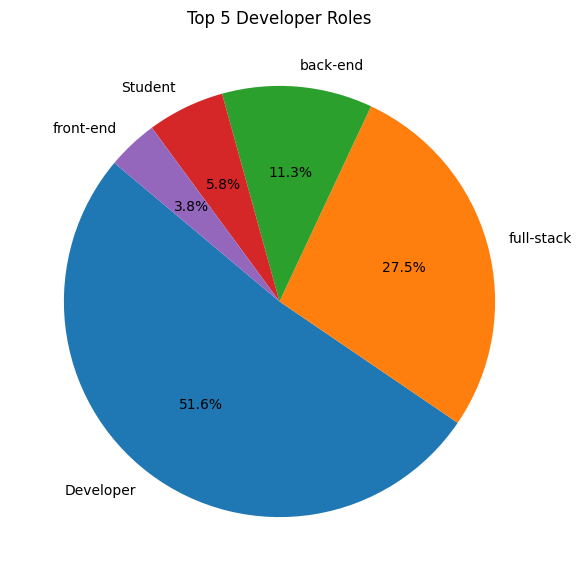

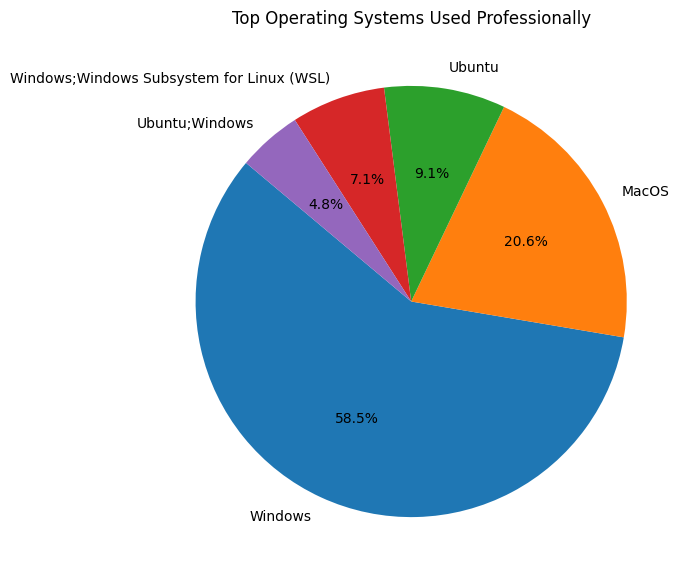

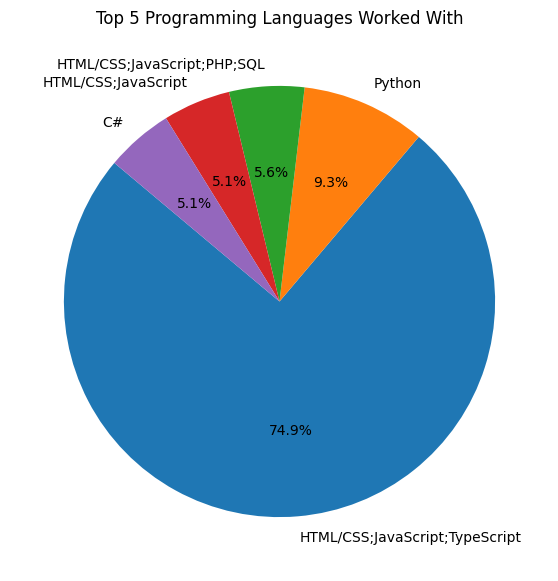

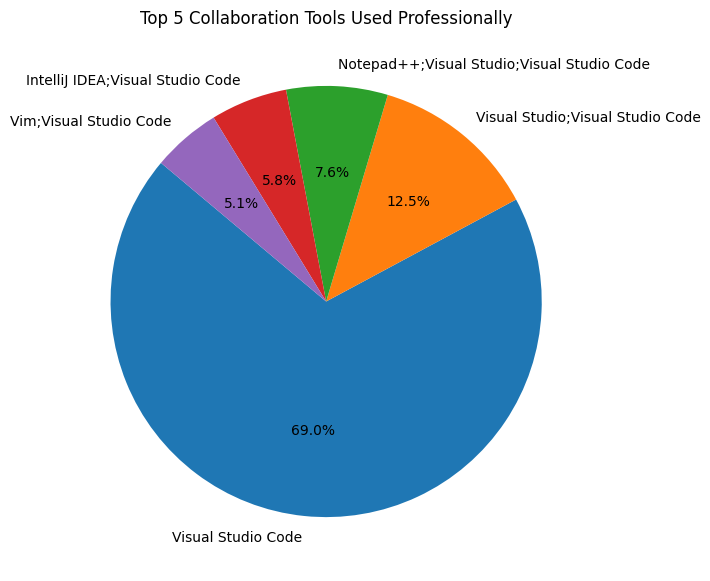

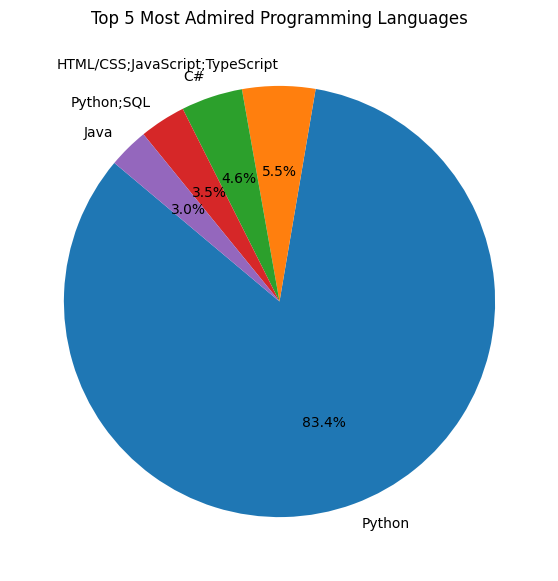

Column 'AIToolCurrentlyUsing' not found in dataframe.


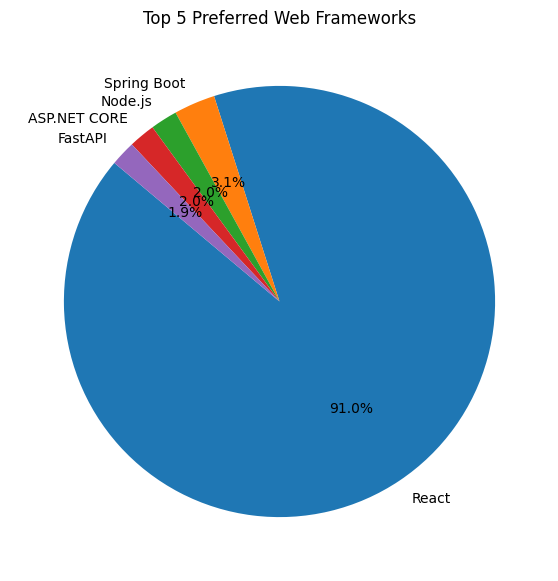

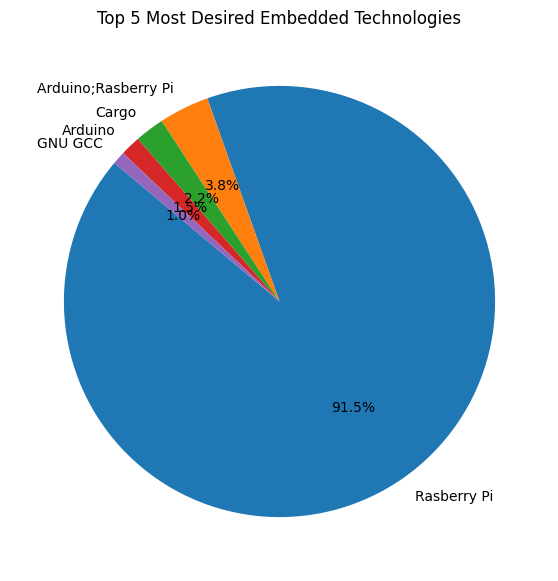

In [42]:
# Helper function to explode multi-value columns into series
def explode_column(df, col):
    return df[col].dropna().str.split(',').explode().str.strip()

# 1.1 Pie Chart of Top 5 Databases Respondents Want to Work With
db_series = explode_column(df, 'DatabaseWantToWorkWith')
db_top5 = db_series.value_counts().head(5)
plt.figure(figsize=(7,7))
plt.pie(db_top5, labels=db_top5.index, autopct='%1.1f%%', startangle=140)
plt.title('Top 5 Databases Respondents Want to Work With')
plt.show()

# 1.2 Pie Chart of Top 5 Developer Roles (DevType)
dev_series = explode_column(df, 'DevType')
dev_top5 = dev_series.value_counts().head(5)
plt.figure(figsize=(7,7))
plt.pie(dev_top5, labels=dev_top5.index, autopct='%1.1f%%', startangle=140)
plt.title('Top 5 Developer Roles')
plt.show()

# 1.3 Pie Chart of Top Operating Systems Used Professionally (OpSysProfessional_use)
os_series = df['OpSysProfessional_use'].dropna()
os_top = os_series.value_counts().head(5)
plt.figure(figsize=(7,7))
plt.pie(os_top, labels=os_top.index, autopct='%1.1f%%', startangle=140)
plt.title('Top Operating Systems Used Professionally')
plt.show()

# 2.1 Pie Chart for Top 5 Programming Languages Respondents Have Worked With
lang_series = explode_column(df, 'LanguageHaveWorkedWith')
lang_top5 = lang_series.value_counts().head(5)
plt.figure(figsize=(7,7))
plt.pie(lang_top5, labels=lang_top5.index, autopct='%1.1f%%', startangle=140)
plt.title('Top 5 Programming Languages Worked With')
plt.show()

# 2.2 Pie Chart for Top Collaboration Tools Used Professionally (NEWCollabToolsHaveWorkedWith)
tools_series = explode_column(df, 'NEWCollabToolsHaveWorkedWith')
tools_top5 = tools_series.value_counts().head(5)
plt.figure(figsize=(7,7))
plt.pie(tools_top5, labels=tools_top5.index, autopct='%1.1f%%', startangle=140)
plt.title('Top 5 Collaboration Tools Used Professionally')
plt.show()

# 3.1 Pie Chart of Top 5 Most Admired Programming Languages (LanguageAdmired)
admired_series = explode_column(df, 'LanguageAdmired')
admired_top5 = admired_series.value_counts().head(5)
plt.figure(figsize=(7,7))
plt.pie(admired_top5, labels=admired_top5.index, autopct='%1.1f%%', startangle=140)
plt.title('Top 5 Most Admired Programming Languages')
plt.show()

# 3.2 Pie Chart of Top 5 AI Tools Currently Used (AIToolCurrentlyUsing)
if 'AIToolCurrentlyUsing' in df.columns:
    ai_tools_series = explode_column(df, 'AIToolCurrentlyUsing')
    ai_tools_top5 = ai_tools_series.value_counts().head(5)
    plt.figure(figsize=(7,7))
    plt.pie(ai_tools_top5, labels=ai_tools_top5.index, autopct='%1.1f%%', startangle=140)
    plt.title('Top 5 AI Tools Currently Used')
    plt.show()
else:
    print("Column 'AIToolCurrentlyUsing' not found in dataframe.")

# 3.3 Pie Chart for Top 5 Preferred Web Frameworks (WebframeWantToWorkWith)
webframe_series = explode_column(df, 'WebframeWantToWorkWith')
webframe_top5 = webframe_series.value_counts().head(5)
plt.figure(figsize=(7,7))
plt.pie(webframe_top5, labels=webframe_top5.index, autopct='%1.1f%%', startangle=140)
plt.title('Top 5 Preferred Web Frameworks')
plt.show()

# 3.4 Pie Chart for Top 5 Most Desired Embedded Technologies (EmbeddedWantToWorkWith)
embedded_series = explode_column(df, 'EmbeddedWantToWorkWith')
embedded_top5 = embedded_series.value_counts().head(5)
plt.figure(figsize=(7,7))
plt.pie(embedded_top5, labels=embedded_top5.index, autopct='%1.1f%%', startangle=140)
plt.title('Top 5 Most Desired Embedded Technologies')
plt.show()


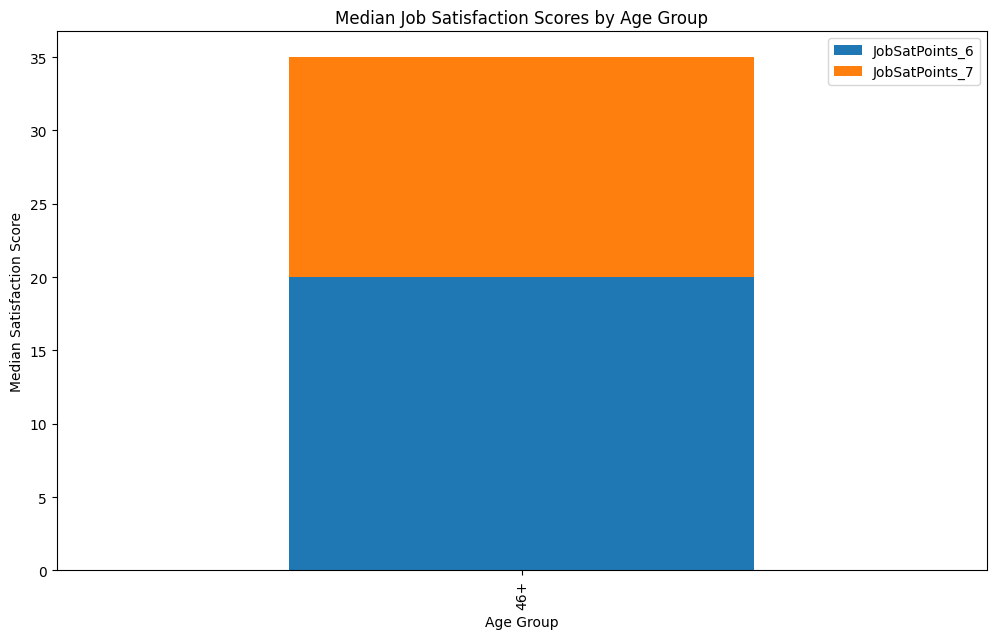

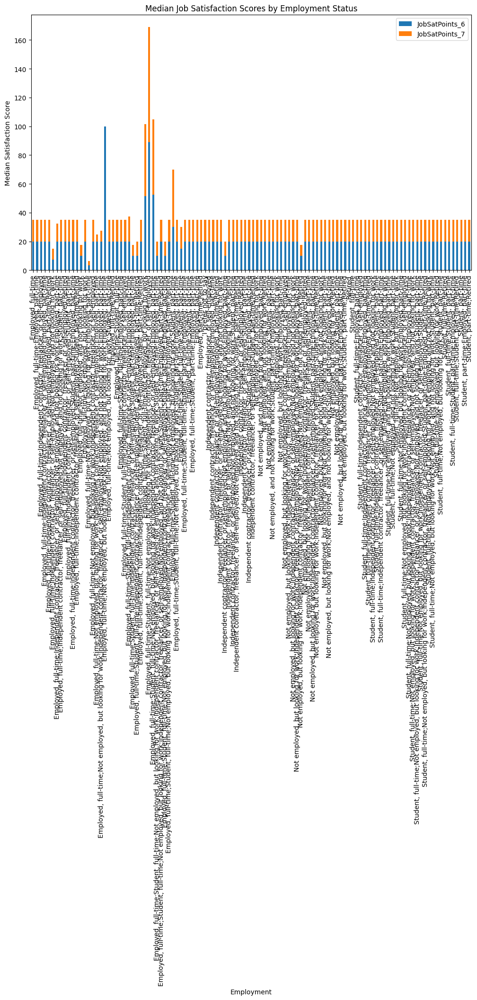

No data available for plot: Median Compensation and Satisfaction for Ages 30-35


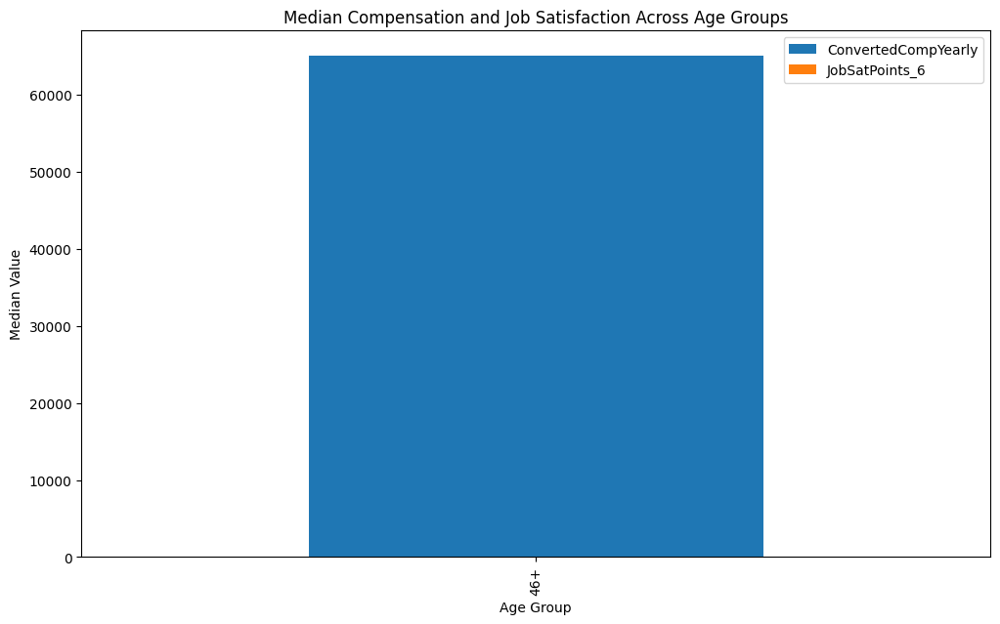

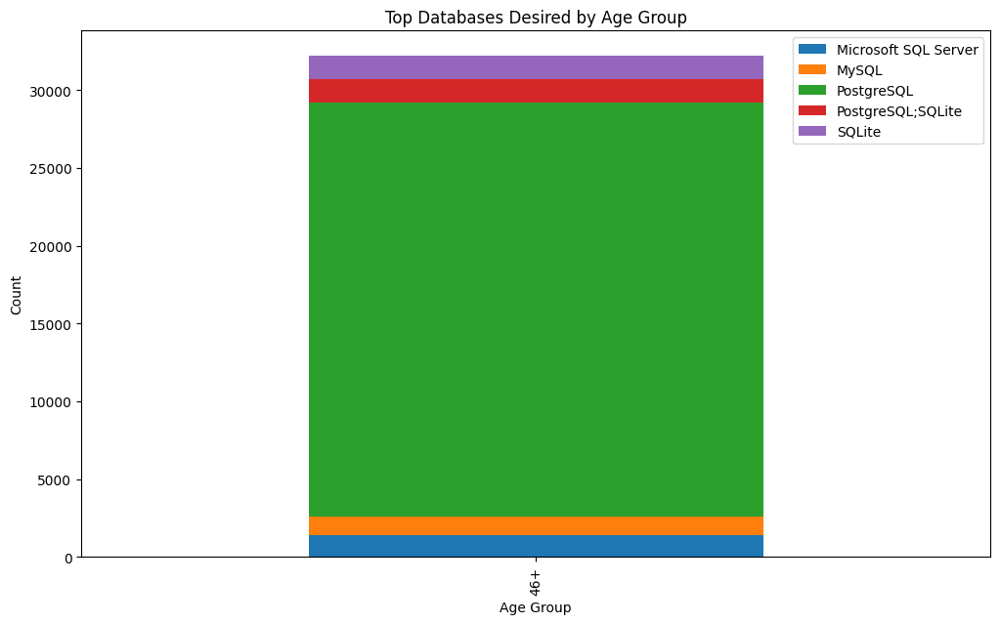

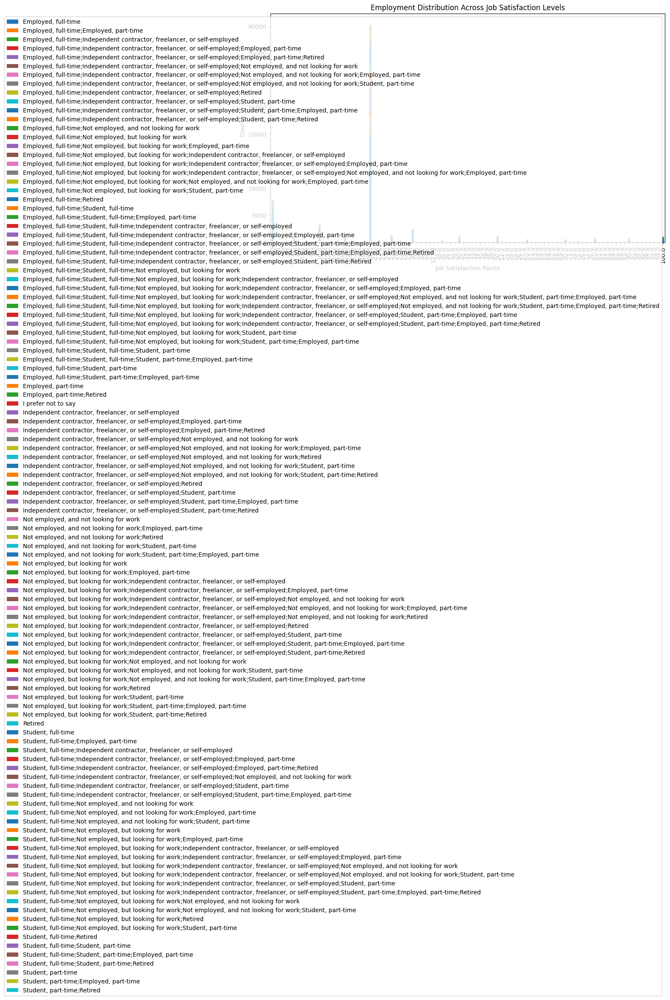

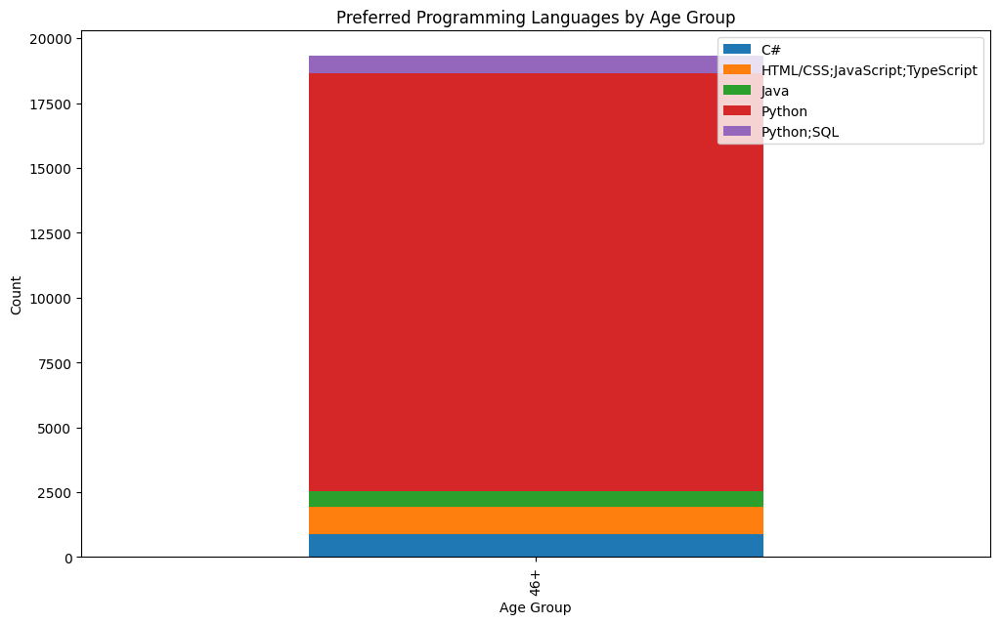

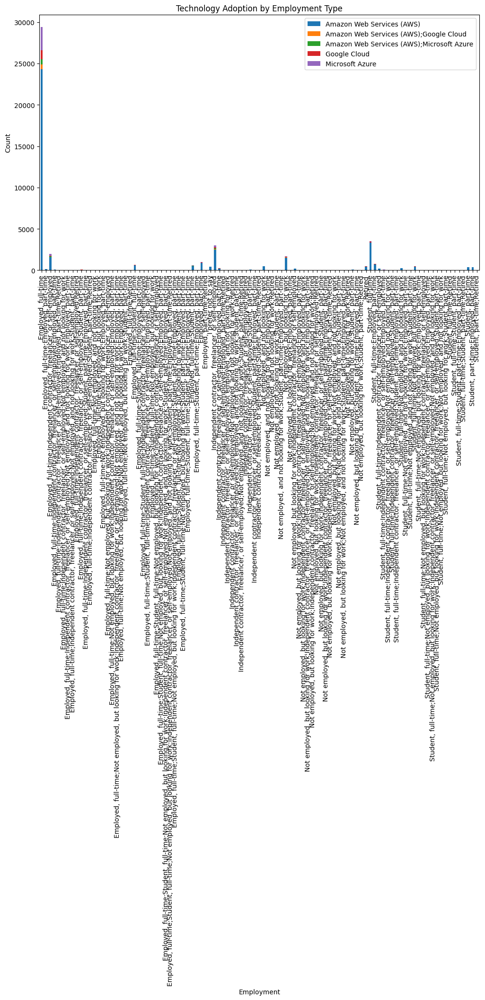

In [43]:
# Convert Age to a categorical age group
def age_to_group(age):
    try:
        age = float(age)
        if age < 25:
            return 'Under 25'
        elif 25 <= age <= 30:
            return '25-30'
        elif 31 <= age <= 35:
            return '31-35'
        elif 36 <= age <= 40:
            return '36-40'
        elif 41 <= age <= 45:
            return '41-45'
        else:
            return '46+'
    except:
        return 'Unknown'

df['AgeGroup'] = df['Age'].apply(age_to_group)

# Helper to plot stacked bar charts from DataFrame
def plot_stacked_bar(data, title, xlabel, ylabel):
    if data.empty:
        print(f"No data available for plot: {title}")
        return
    data.plot(kind='bar', stacked=True, figsize=(12,7))
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend(loc='upper right')
    plt.show()

# Task 1.1: Stacked Chart of Median JobSatPoints_6 and JobSatPoints_7 by Age Group
job_sat_age = df.groupby('AgeGroup')[['JobSatPoints_6', 'JobSatPoints_7']].median().drop('Unknown', errors='ignore')
plot_stacked_bar(job_sat_age, 'Median Job Satisfaction Scores by Age Group', 'Age Group', 'Median Satisfaction Score')

# Task 1.2: Stacked Chart of JobSatPoints_6 and JobSatPoints_7 by Employment Status
job_sat_emp = df.groupby('Employment')[['JobSatPoints_6', 'JobSatPoints_7']].median()
plot_stacked_bar(job_sat_emp, 'Median Job Satisfaction Scores by Employment Status', 'Employment', 'Median Satisfaction Score')

# Task 2.1: Stacked Chart for Compensation and Job Satisfaction (ages 30-35)
age_30_35 = df[(df['AgeGroup'] == '31-35')]
comp_sat_30_35 = age_30_35.groupby('AgeGroup')[['ConvertedCompYearly', 'JobSatPoints_6']].median()
plot_stacked_bar(comp_sat_30_35, 'Median Compensation and Satisfaction for Ages 30-35', 'Age Group', 'Median Values')

# Task 2.2: Stacked Chart of Median Compensation and Job Satisfaction Across Age Groups
comp_sat_age = df.groupby('AgeGroup')[['ConvertedCompYearly','JobSatPoints_6']].median().drop('Unknown', errors='ignore')
plot_stacked_bar(comp_sat_age, 'Median Compensation and Job Satisfaction Across Age Groups', 'Age Group', 'Median Value')

# Task 3.1: Stacked Chart of Preferred Databases by Age Group
# Explode multi-valued DatabaseWantToWorkWith column
db_exp = df[['AgeGroup','DatabaseWantToWorkWith']].dropna()
db_exp = db_exp.assign(Database=db_exp['DatabaseWantToWorkWith'].str.split(',')).explode('Database')
db_exp['Database'] = db_exp['Database'].str.strip()
top5_dbs = db_exp['Database'].value_counts().head(5).index
db_filtered = db_exp[db_exp['Database'].isin(top5_dbs)]
db_pivot = pd.crosstab(db_filtered['AgeGroup'], db_filtered['Database']).fillna(0).drop('Unknown', errors='ignore')
plot_stacked_bar(db_pivot, 'Top Databases Desired by Age Group', 'Age Group', 'Count')

# Task 3.2: Stacked Chart of Employment Type by Job Satisfaction (JobSatPoints_6)
emp_jobsat = df.groupby(['JobSatPoints_6','Employment']).size().unstack(fill_value=0)
plot_stacked_bar(emp_jobsat, 'Employment Distribution Across Job Satisfaction Levels', 'Job Satisfaction Points', 'Count')

# Task 4.1: Stacked Chart for Preferred Programming Languages by Age Group
lang_exp = df[['AgeGroup','LanguageAdmired']].dropna()
lang_exp = lang_exp.assign(Language=lang_exp['LanguageAdmired'].str.split(',')).explode('Language')
lang_exp['Language'] = lang_exp['Language'].str.strip()
top5_lang = lang_exp['Language'].value_counts().head(5).index
lang_filtered = lang_exp[lang_exp['Language'].isin(top5_lang)]
lang_pivot = pd.crosstab(lang_filtered['AgeGroup'], lang_filtered['Language']).fillna(0).drop('Unknown', errors='ignore')
plot_stacked_bar(lang_pivot, 'Preferred Programming Languages by Age Group', 'Age Group', 'Count')

# Task 4.2: Stacked Chart for Technology Adoption by Employment Type (PlatformAdmired)
plat_exp = df[['Employment','PlatformAdmired']].dropna()
plat_exp = plat_exp.assign(Platform=plat_exp['PlatformAdmired'].str.split(',')).explode('Platform')
plat_exp['Platform'] = plat_exp['Platform'].str.strip()
top5_plat = plat_exp['Platform'].value_counts().head(5).index
plat_filtered = plat_exp[plat_exp['Platform'].isin(top5_plat)]
plat_pivot = pd.crosstab(plat_filtered['Employment'], plat_filtered['Platform']).fillna(0)
plot_stacked_bar(plat_pivot, 'Technology Adoption by Employment Type', 'Employment', 'Count')


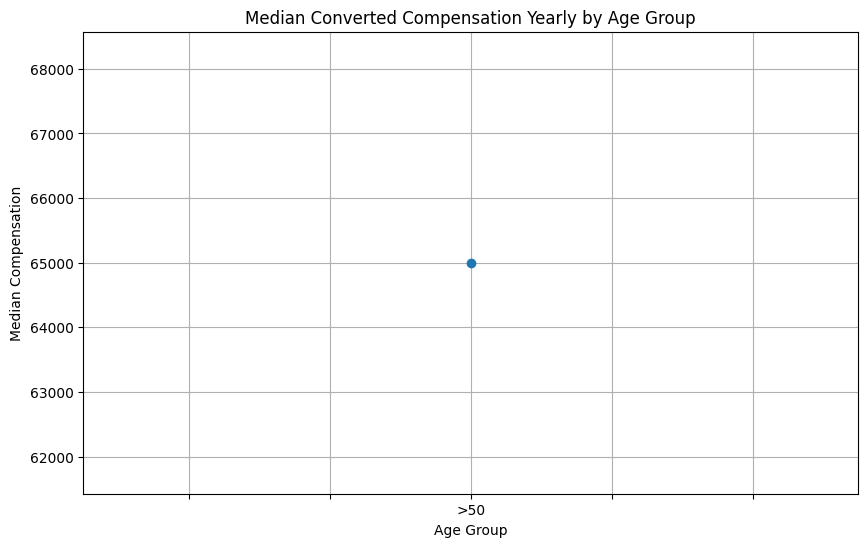

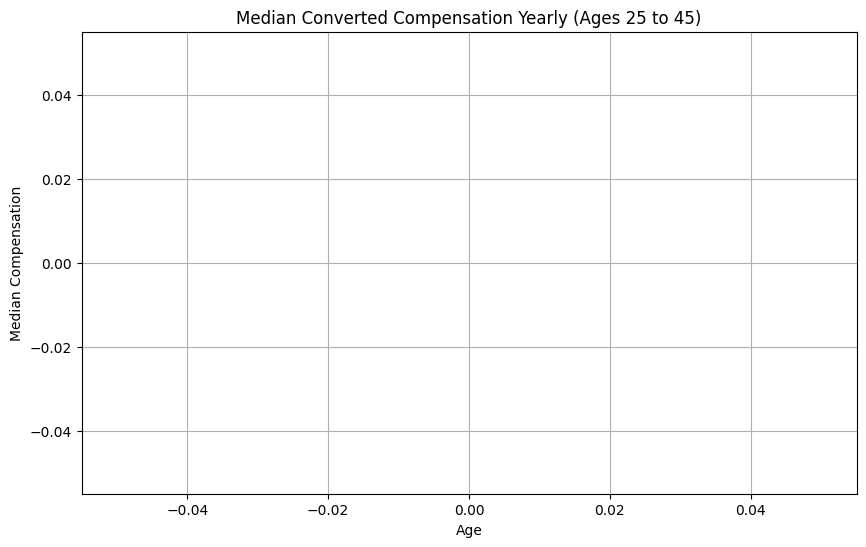

/var/folders/r4/p9whfw6x43b8g5m7n4qp05_c0000gn/T/ipykernel_39774/3652587243.py:53: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_jobsat_exp = df.groupby('ExperienceLevel')['JobSatPoints_6'].median().dropna()


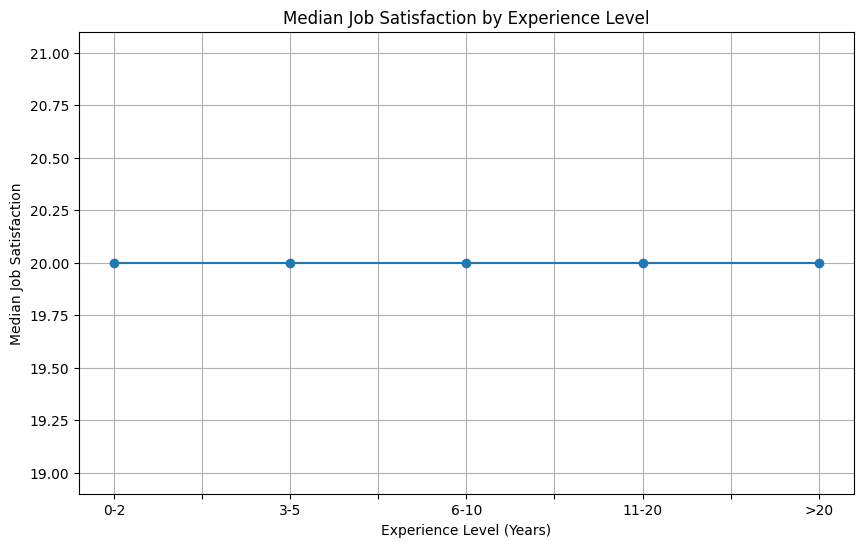

/var/folders/r4/p9whfw6x43b8g5m7n4qp05_c0000gn/T/ipykernel_39774/3652587243.py:63: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_comp_exp = df.groupby('ExperienceLevel')['ConvertedCompYearly'].median().dropna()


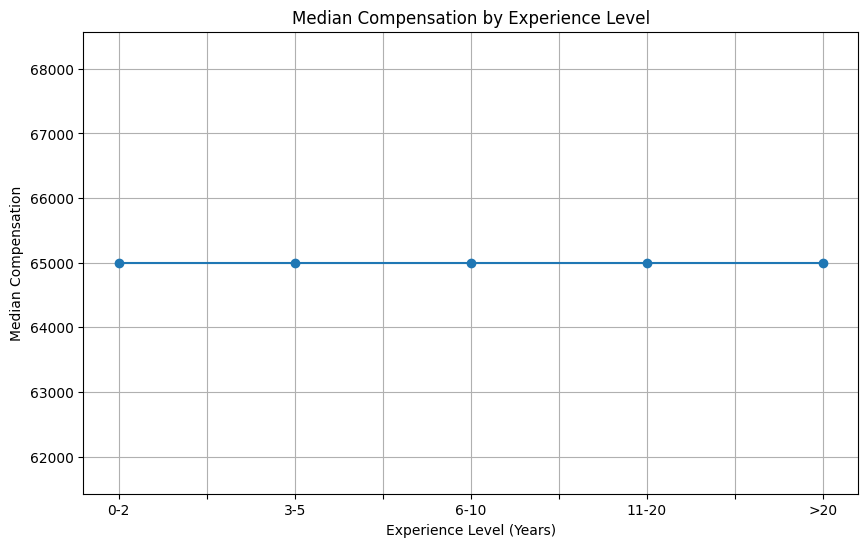

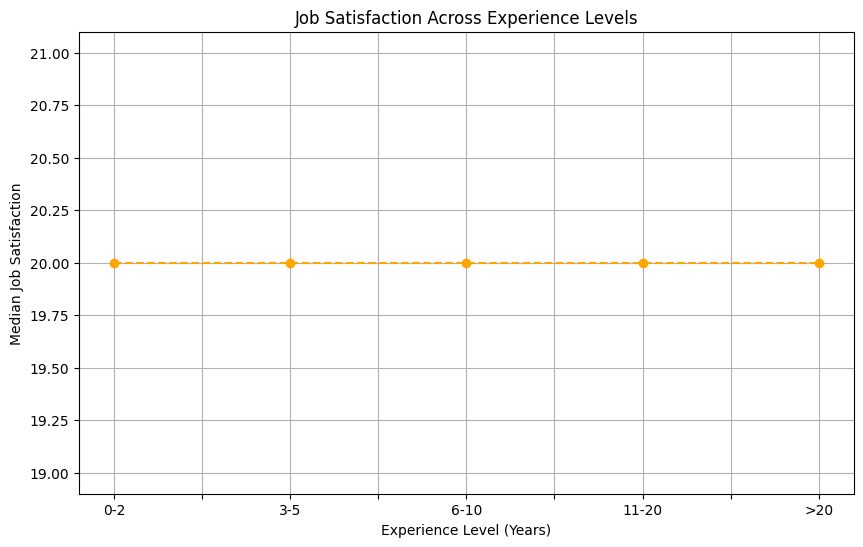

In [44]:
# Helper function to categorize ages into groups
def age_group(age):
    try:
        age = float(age)
        if age < 25:
            return '<25'
        elif 25 <= age <= 30:
            return '25-30'
        elif 31 <= age <= 35:
            return '31-35'
        elif 36 <= age <= 40:
            return '36-40'
        elif 41 <= age <= 45:
            return '41-45'
        elif 46 <= age <= 50:
            return '46-50'
        else:
            return '>50'
    except:
        return 'Unknown'

df['AgeGroup'] = df['Age'].apply(age_group)

# Task 1.1: Line Chart of Median ConvertedCompYearly by Age Group

median_comp_age = df.groupby('AgeGroup')['ConvertedCompYearly'].median().drop('Unknown', errors='ignore')
median_comp_age.plot(kind='line', marker='o', figsize=(10,6))
plt.title('Median Converted Compensation Yearly by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Median Compensation')
plt.grid(True)
plt.show()

# Task 1.2: Line Chart of Median ConvertedCompYearly for Ages 25 to 45

age_25_45 = df[(df['Age'] >= 25) & (df['Age'] <= 45)][['Age', 'ConvertedCompYearly']].dropna()
age_25_45_grouped = age_25_45.groupby('Age')['ConvertedCompYearly'].median()
age_25_45_grouped.plot(kind='line', marker='o', figsize=(10,6))
plt.title('Median Converted Compensation Yearly (Ages 25 to 45)')
plt.xlabel('Age')
plt.ylabel('Median Compensation')
plt.grid(True)
plt.show()

# Task 2.1: Line Chart of Job Satisfaction (JobSatPoints_6) by Experience Level

# Using YearsCodePro as experience surrogate
df['YearsCodePro_num'] = pd.to_numeric(df['YearsCodePro'], errors='coerce')
experience_bins = [0, 2, 5, 10, 20, 50]
experience_labels = ['0-2', '3-5', '6-10', '11-20', '>20']
df['ExperienceLevel'] = pd.cut(df['YearsCodePro_num'], bins=experience_bins, labels=experience_labels, right=False)

median_jobsat_exp = df.groupby('ExperienceLevel')['JobSatPoints_6'].median().dropna()
median_jobsat_exp.plot(kind='line', marker='o', figsize=(10,6))
plt.title('Median Job Satisfaction by Experience Level')
plt.xlabel('Experience Level (Years)')
plt.ylabel('Median Job Satisfaction')
plt.grid(True)
plt.show()

# Task 3.1: Line Chart of Median ConvertedCompYearly Over Experience Level

median_comp_exp = df.groupby('ExperienceLevel')['ConvertedCompYearly'].median().dropna()
median_comp_exp.plot(kind='line', marker='o', figsize=(10,6))
plt.title('Median Compensation by Experience Level')
plt.xlabel('Experience Level (Years)')
plt.ylabel('Median Compensation')
plt.grid(True)
plt.show()

# Task 3.2: Line Chart of Job Satisfaction (JobSatPoints_6) Across Experience Levels

median_jobsat_exp.plot(kind='line', marker='o', figsize=(10,6), linestyle='--', color='orange')
plt.title('Job Satisfaction Across Experience Levels')
plt.xlabel('Experience Level (Years)')
plt.ylabel('Median Job Satisfaction')
plt.grid(True)
plt.show()


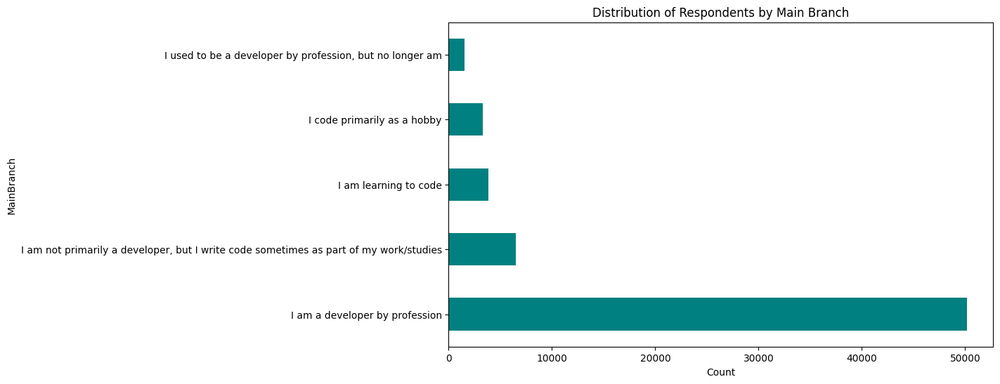

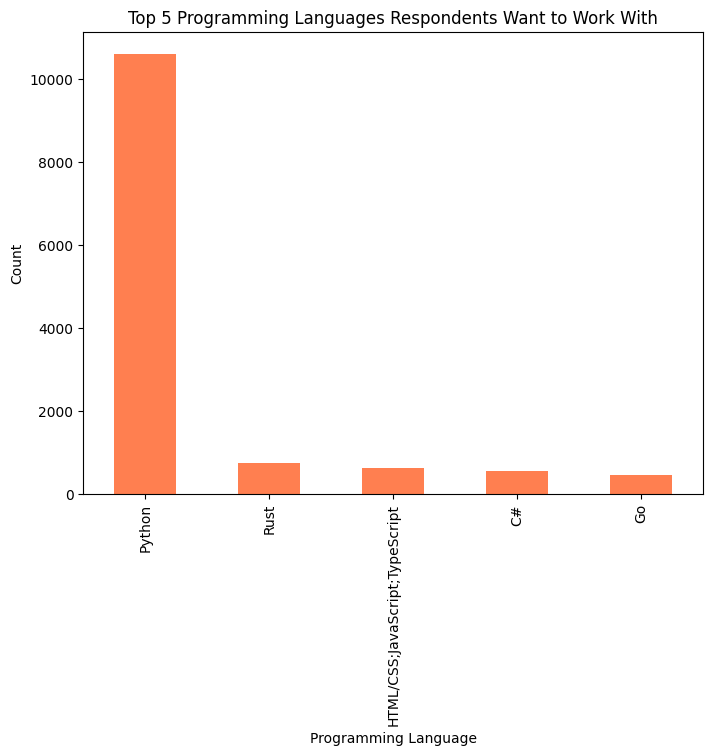

/var/folders/r4/p9whfw6x43b8g5m7n4qp05_c0000gn/T/ipykernel_39774/2172468901.py:28: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_sats = df.groupby('AgeGroup')[['JobSatPoints_6','JobSatPoints_7']].median()


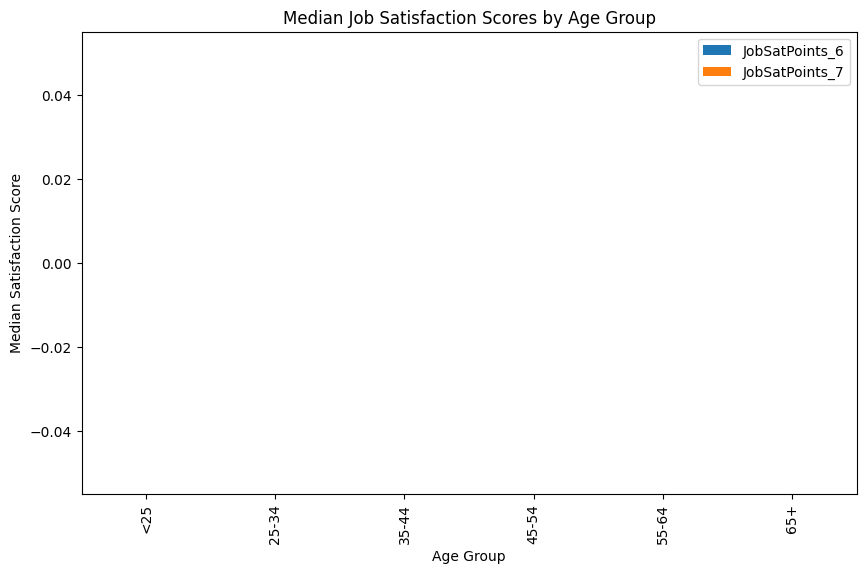

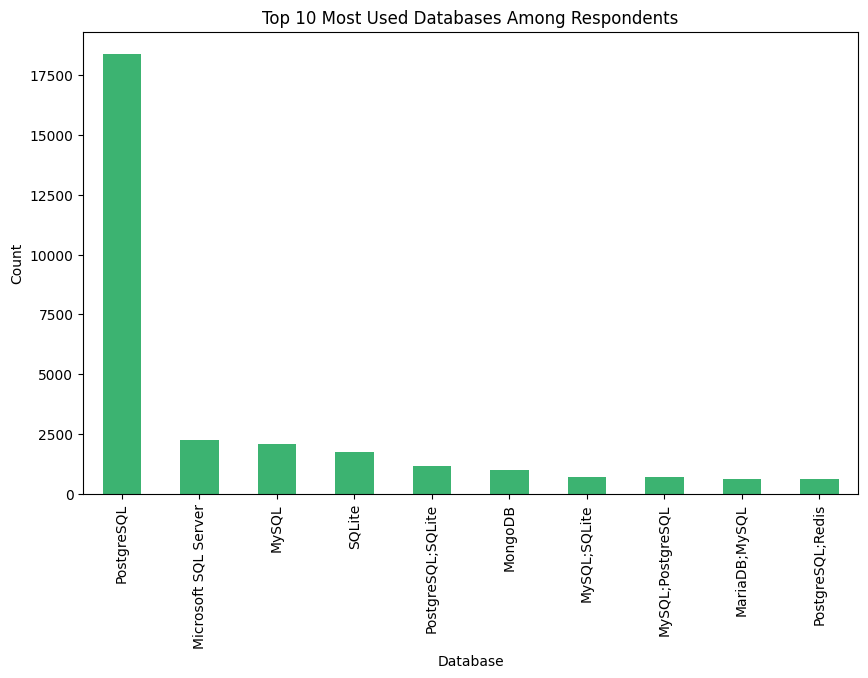

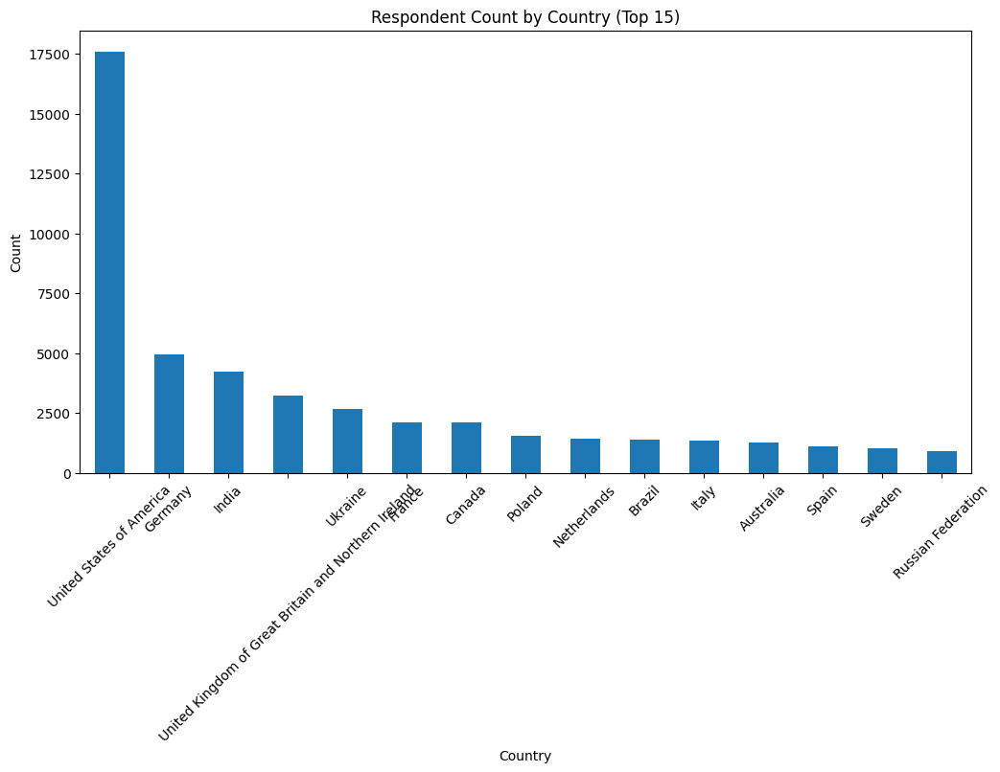

In [45]:
# Convert Age to numeric, handling errors
df['Age_numeric'] = pd.to_numeric(df['Age'], errors='coerce')

# Task 3.1: Horizontal Bar Chart of MainBranch Distribution
branch_counts = df['MainBranch'].value_counts()
plt.figure(figsize=(10,6))
branch_counts.plot(kind='barh', color='teal')
plt.title('Distribution of Respondents by Main Branch')
plt.xlabel('Count')
plt.ylabel('MainBranch')
plt.show()

# Task 3.2: Vertical Bar Chart of Top 5 Programming Languages Respondents Want to Work With
lang_series = df['LanguageWantToWorkWith'].dropna().str.split(',').explode().str.strip()
top5_lang = lang_series.value_counts().head(5)
if top5_lang.empty:
	print("No data available for Top 5 Programming Languages Respondents Want to Work With.")
else:
	plt.figure(figsize=(8,6))
	top5_lang.plot(kind='bar', color='coral')
	plt.title('Top 5 Programming Languages Respondents Want to Work With')
	plt.xlabel('Programming Language')
	plt.ylabel('Count')
	plt.show()

# Task 3.3: Stacked Bar Chart of Median JobSatPoints_6 and JobSatPoints_7 by Age Group
df['AgeGroup'] = pd.cut(df['Age_numeric'], bins=[0,25,35,45,55,65,100], labels=['<25','25-34','35-44','45-54','55-64','65+'])
median_sats = df.groupby('AgeGroup')[['JobSatPoints_6','JobSatPoints_7']].median()
median_sats.plot(kind='bar', stacked=True, figsize=(10,6))
plt.title('Median Job Satisfaction Scores by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Median Satisfaction Score')
plt.show()

# Task 3.4: Bar Chart of Database Popularity (DatabaseHaveWorkedWith)
db_series = df['DatabaseHaveWorkedWith'].dropna().str.split(',').explode().str.strip()
db_counts = db_series.value_counts().head(10)
if db_counts.empty:
	print("No data available for Database Popularity.")
else:
	plt.figure(figsize=(10,6))
	db_counts.plot(kind='bar', color='mediumseagreen')
	plt.title('Top 10 Most Used Databases Among Respondents')
	plt.xlabel('Database')
	plt.ylabel('Count')
	plt.show()


# Task 4.2: Bar Chart of Respondent Count by Country
country_counts = df['Country'].value_counts().head(15)
plt.figure(figsize=(12,6))
country_counts.plot(kind='bar')
plt.title('Respondent Count by Country (Top 15)')
plt.xlabel('Country')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()
